# Cluster Analysis Tutorial

This notebook is a continuation of the Preprocess tutorial, and assumes you are working with an adata object that has been pre-processed (i.e. quality controlled to filter cells, normalized, highly variable genes selected, visualization coordinates calculated). In this tutorial, we will cluster our dataset, identify marker genes and annotate our clusters, and look at the expression of individual genes.

This notebook is largely adapted from an [ipython notebook](https://github.com/theislab/single-cell-tutorial) provided by the Theis Lab as part of their Molecular Systems Biology submission "Current best practices in single‐cell RNA‐seq analysis: a tutorial" ([Luecken and Theis, 2019](https://doi.org/10.15252/msb.20188746)), as well as the basic scanpy [Preprocessing and clustering 3k PBMCs](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html) tutorial. Both the original notebooks and paper are worth checking out to get a more in-depth idea of the steps involved with scRNA-seq analysis (and the "best" ways to do them!). We also heavily utilized Bioconductor's online book [*Orchestrating Single-Cell Analysis with Bioconductor*](https://bioconductor.org/books/release/OSCA/) for some of the conceptual explanations. This is a fantastic resource to take a deeper dive into the various steps of scRNA-seq analysis (and is great if you are doing your scRNA-seq analysis in R!).

For the first two tutorials - Preprocess and Cluster Analysis - we will be working with a publicly available scRNA-seq dataset that consists of *3k PBMCs from a Healthy Donor*, which is freely available from 10x Genomics ([here](http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz) from this [webpage](https://support.10xgenomics.com/single-cell-gene-expression/datasets/1.1.0/pbmc3k)). *You do **not** have to download this dataset!* It is included as a built-in dataset with scanpy.

# Table of Contents

* [1 Setting Up the Coding Environment](#1-Setting-Up-the-Coding-Environment)
* [2 Reading in the Data](#2-Reading-in-the-Data)
* [3 Clustering](#3-Clustering)
* [4 Marker Genes and Cluster Annotation](#4-Marker-Genes-and-Cluster-Annotation)
    - [Data-Deriven Marker Genes](#Data-Deriven-Marker-Genes)
    - [Known Marker Genes](#Known-Marker-Genes)
    - [Annotation](#Annotation)
* [5 Cluster Manipulation](#5-Cluster-Manipulation)
    - [Removing Clusters](#Removing-Clusters)
    - [Merging Clusters](#Merging-Clusters)
    - [Splitting Clusters](#Splitting-Clusters)
* [6 Summary](#6-Summary)
* [7 Appendix](#7-Appendix)
    - [Subsetting Data](#Subsetting-Data)
    - [Compare Cluster Gene Expression](#Compare-Cluster-Gene-Expression)
    - [Additional Plotting Tools](#Additional-Plotting-Tools)

# 1 Setting Up the Coding Environment

Just like in our Preprocess tutorial, we need to set up our jupyter notebook and load in all of the python modules, packages, and libraries we need for scRNA-seq analysis. The coding environment for this notebook is the same as what we used for the Preprocess tutorial.

In [1]:
# main scRNA-seq analysis toolkit
import scanpy as sc

# data science tools
import numpy as np
import scipy as sp
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

# operating system interface
import os

In [2]:
plt.rcParams['figure.figsize']=(2,2) # rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(dpi=200, dpi_save=300, format='ps') # scanpy figure parameters
#sc.logging.print_versions() # prints out version info for modules/packages/libraries used in the notebook. Important for reproducibility! 

In [3]:
# Files and Directories
sc.settings.figdir = './figures/'
results = './results/scanpy_tutorial.h5ad'

**A Note on Color and Data Visualization**

For this notebook, we are also going to define some color maps to look at gene expression in our UMAP plots. Here we define a *purple_colormap* and a *green_colormap*. You can easily change the colors to your own personal preference. Scanpy's plots are built on `matplotlib`, a python library used for data visualization. You can see all of the available colormaps in `matplotlib` [here](https://matplotlib.org/stable/tutorials/colors/colormaps.html). The colors you pick for your plots matter in data science and bioinformatics, as different color schemes can be used to convey different information. *Sequential* colormaps are used for representing information that has ordering (think of the expression of a gene in a cell; it can highly expressed, weakly expressed, or not expressed at all). *Diverging* colormaps are used for when the information being plotted has a critical middle value (for instance, you have a base gene expression and want to know if that gene is upregulated or downregulated in the cells in your dataset). *Qualitative* colormaps are often miscellaneous colors and should be used to represent information which does not have ordering or relationships (most UMAP/tSNE plots use qualitative colormaps to color the clusters).

In [4]:
# Define a color map for combined marker expression (i.e., marker expression profiles)
colors2p = plt.cm.Purples(np.linspace(0, 1, 128))
colors3p = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsCombp = np.vstack([colors3p, colors2p])
mymap_purple = colors.LinearSegmentedColormap.from_list('purple_colormap', colorsCombp)

# Define a color map for individual gene expression
colors2r = plt.cm.Greens(np.linspace(0, 1, 128))
colors3r = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsCombr = np.vstack([colors3r, colors2r])
mymap_green = colors.LinearSegmentedColormap.from_list('green_colormap', colorsCombr)

# 2 Reading in the Data

In our Preprocess tutorial we loaded in a built-in dataset provided with the scanpy toolkit (or, if you were following along with your own data, then you read in the data files generated by Cell Ranger). Here, we are going to read in our preprocessed adata object from the Preprocess tutorial (remember, we saved this as an .h5ad file at the end of the notebook). Reading in .h5ad objects is super simple in scanpy:

In [5]:
# load in saved adata object
adata = sc.read(results)

In [6]:
# If we look at our adata object, we should see all of our additions from the preprocessing steps
adata

AnnData object with n_obs × n_vars = 2521 × 16470
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# 3 Clustering

Clustering is a central component of any scRNA-seq analysis pipeline (and is the most recognizable! Everyone can clock a tSNE or UMAP plot). In order to more comprehensively understand the underlying heterogeneity in our dataset, we need to identify cell groups in an unbiased way, which is what clustering does. When we cluster our data, we are embedding our cells in a graph structure (typically using a K-nearest neighbor, or KNN, graph), with edges drawn between cells that share similar gene expression patterns. The graph structure is partitioned into highly interconnected communities, where cells that are most alike to one another are partitioned into the same community.

We do have some input over what the clusters look like. By using the *resolution* parameter in our clustering function (see code block below), we can control whether we get back major, coarse clusters (e.g. major cells types) or smaller, refined clusters (e.g. cell subtypes). The resolution that works best for you depends on your dataset and your specific questions. Note that you can lose meaningful biological information if you under-cluster or over-cluster, and it's best to try out a few different resolution parameters and compare the resulting clusters with gene expression and known biology before settling on a final clustering. 

Here we will be using the graph-based Leiden clustering algorithm to find our clusters. Check out the [Clustering chapter](https://bioconductor.org/books/release/OSCA/clustering.html#k-means-clustering) in *Orchestrating Single-Cell Analysis for Bioconductor* for more info on clustering theory, and different methods to cluster cells.

In [7]:
# Perform clustering using highly variable genes and different resolution parameters
# The clusterings found by different resolution parameters are all stored as observations in the adata object
sc.tl.leiden(adata, resolution=1.0, key_added='leiden_r1.0')
sc.tl.leiden(adata, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_r0.5')

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_r1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_r0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:00)


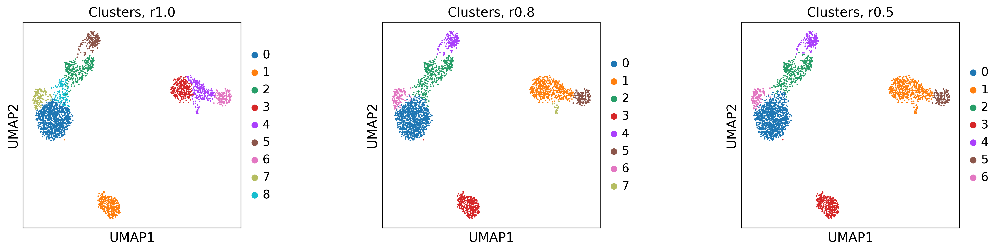

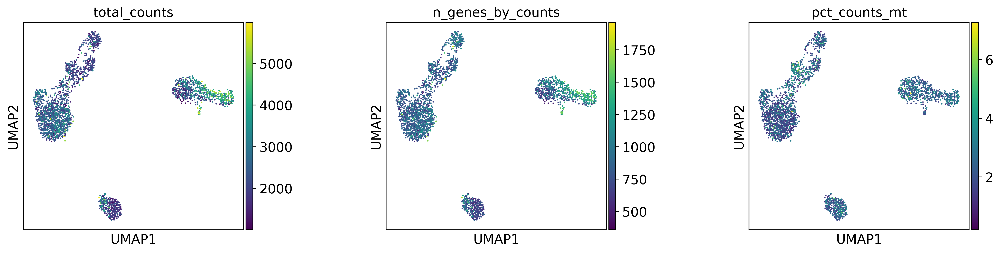

In [8]:
# Visualize the clustering
sc.pl.umap(adata, color=['leiden_r1.0', 'leiden_r0.8', 'leiden_r0.5'], 
                  title=['Clusters, r1.0', 'Clusters, r0.8', 'Clusters, r0.5'],
                  wspace = 0.5, 
                  size = 10)

sc.pl.umap(adata, color=['total_counts', 'n_genes_by_counts', 'pct_counts_mt'],
                  wspace = 0.5, 
                  size = 10)

You can see that setting our *resolution* parameter to "1.0" resulted in the most clusters, while setting our *resolution* parameter to "0.5" resulted in the fewest clusters. For demonstration purposes, we'll work with the middle-ground *resolution* parameter of "0.8". At this point, it is a good idea to see if you have any one single cluster that is dominated by our QC metrics. If you do, you might want to revisit the preprocessing steps or potentially remove the entire offending cluster from the dataset at this point. You always want to check and make sure that your clusters appear to be driven by biology and not by technical covariates (this alsos include *batch* if you are working with a combined dataset).

# 4 Marker Genes and Cluster Annotation

## Data-Deriven Marker Genes

To begin annotating our clusters, we first find genes that are up-regulated in each cluster compared to all other clusters. These are our marker genes. All genes are taken into account (i.e., the test is automatically performed on the data stored in *adata.raw*, which is uncorrected and contains all genes), as any gene may be an informative marker. Here we identify and return the top 20 marker genes for each cluster.

In [9]:
# Calculate marker genes
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.8', key_added='rank_genes_all', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_all']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


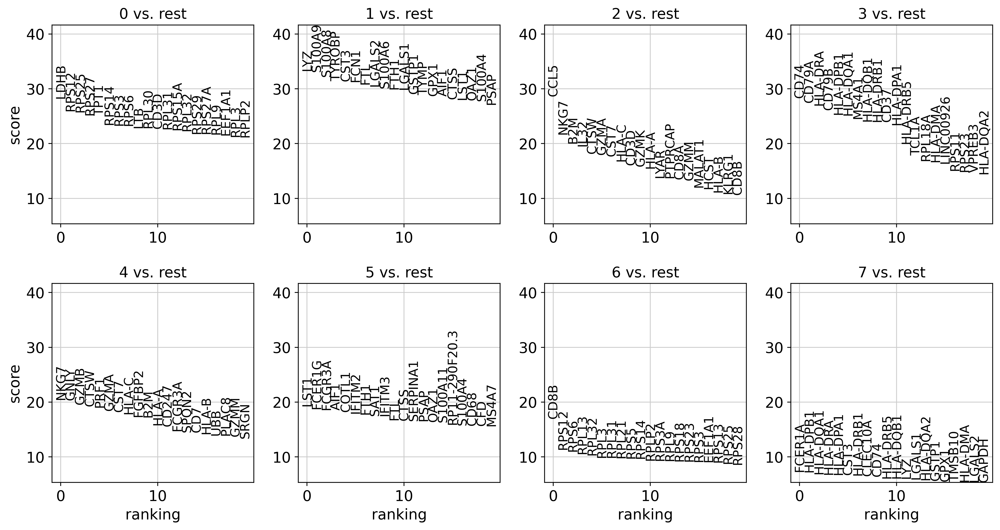

In [10]:
# Plot marker genes
sc.pl.rank_genes_groups(adata, 
                        key = 'rank_genes_all', 
                        groups = ['0', '1', '2', '3', '4', '5', '6', '7'], 
                        fontsize = 12)

Looking at these plots, we can already start to identify some of clusters. For example, cluster 4 is characterized by high expression of NKG7 and GNLY, which are known markers of NK cells. (Note: if you want to get these results as a dataframe, run `sc.get.rank_genes_groups_df(adata, group=None, key='rank_genes_all')`!)

## Known Marker Genes

To further identify the clusters, we can also look at the overlap of data-deriven marker genes with a list of known marker genes in our biological system. In practice, marker gene sets can be obtained from public databases such as Linnarson's mouse brain atlas, various Human Cell Atlas datasets, other published reference atlases, and even data generated in your own lab. (It should be noted that marker genes may not always overlap as expected given that atlases tend to be investigated under wild-type conditions.)

In [11]:
# Known marker genes:
marker_genes = dict()
marker_genes['CD4_T_Cells']=['IL7R']
marker_genes['Classic_Monocytes']=['CD14', 'LYZ']
marker_genes['Inflammed_Monocytes']=['CD14']
marker_genes['B_Cells']=['MS4A1', 'CD19', 'CD27']
marker_genes['CD8_T_Cells']=['CD8A']
marker_genes['NK_Cells']=['GNLY', 'NKG7']
marker_genes['FCGR3Apos_Monocytes']=['FCGR3A', 'MS4A7']
marker_genes['Dendritic_Cells']=['FCER1A', 'CST3']
marker_genes['Megakaryocytes']=['PPBP']

We can calculate an overlap score between data-deriven marker genes (stored in `rank_genes_all`) and provided markers (in this case, `marker_genes`, the dictionary we constructed in the preceeding code chunk). The output is a pandas dataframe which we can use to annotate clusters based on marker gene overlaps.

In [12]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_all')
cell_annotation

,0,1,2,3,4,5,6,7
CD4_T_Cells,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Classic_Monocytes,0.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0
Inflammed_Monocytes,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
B_Cells,1.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0
CD8_T_Cells,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
NK_Cells,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0
FCGR3Apos_Monocytes,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0
Dendritic_Cells,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0
Megakaryocytes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In this next code chunk, we are creating expression marker profiles for our dataset based on our known marker genes. First we check if our marker genes are present in our dataset. We can take an array of marker genes for a specified cell type, i.e *NK cells*, and check that array against all the genes present in our adata object. This returns an array of booleans (for each gene in our adata object, if it matches one of our marker genes we assign the value *True*, and if no match is found we assign the value *False*). Next, we calculate the mean expression of all marker genes found in our dataset per cell and store these values in our adata object as observations (obs). This lets us plot marker expression profiles for specific cell types based on known marker genes, which is another way that we can start annotating clusters.

In [13]:
# Check expression of markers
ids_CD4_T_Cells = np.in1d(adata.var_names, marker_genes['CD4_T_Cells'])
ids_Classic_Monocytes = np.in1d(adata.var_names, marker_genes['Classic_Monocytes'])
ids_Inflammed_Monocytes = np.in1d(adata.var_names, marker_genes['Inflammed_Monocytes'])
ids_B_Cells = np.in1d(adata.var_names, marker_genes['B_Cells'])
ids_CD8_T_Cells = np.in1d(adata.var_names, marker_genes['CD8_T_Cells'])
ids_NK_Cells = np.in1d(adata.var_names, marker_genes['NK_Cells'])
ids_FCGR3Apos_Monocytes = np.in1d(adata.var_names, marker_genes['FCGR3Apos_Monocytes'])
ids_Dendritic_Cells = np.in1d(adata.var_names, marker_genes['Dendritic_Cells'])
ids_Megakaryocytes = np.in1d(adata.var_names, marker_genes['Megakaryocytes'])

# Calculate the mean expression of markers
adata.obs['CD4_T_Cells_marker_expr'] = np.ravel(adata.X[:,ids_CD4_T_Cells].mean(1))
adata.obs['Classic_Monocytes_marker_expr'] = np.ravel(adata.X[:,ids_Classic_Monocytes].mean(1))
adata.obs['Inflammed_Monocytes_marker_expr'] = np.ravel(adata.X[:,ids_Inflammed_Monocytes].mean(1))
adata.obs['B_Cells_marker_expr'] = np.ravel(adata.X[:,ids_B_Cells].mean(1))
adata.obs['CD8_T_Cells_marker_expr'] = np.ravel(adata.X[:,ids_CD8_T_Cells].mean(1))
adata.obs['NK_Cells_marker_expr'] = np.ravel(adata.X[:,ids_NK_Cells].mean(1))
adata.obs['FCGR3Apos_Monocytes_marker_expr'] = np.ravel(adata.X[:,ids_FCGR3Apos_Monocytes].mean(1))
adata.obs['Dendritic_Cells_marker_expr'] = np.ravel(adata.X[:,ids_Dendritic_Cells].mean(1))
adata.obs['Megakaryocytes_marker_expr'] = np.ravel(adata.X[:,ids_Megakaryocytes].mean(1))

In [14]:
# If you check our adata object, you'll see these marker expression profiles stored as observations (obs)
adata

AnnData object with n_obs × n_vars = 2521 × 16470
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'leiden_r1.0', 'leiden_r0.8', 'leiden_r0.5', 'CD4_T_Cells_marker_expr', 'Classic_Monocytes_marker_expr', 'Inflammed_Monocytes_marker_expr', 'B_Cells_marker_expr', 'CD8_T_Cells_marker_expr', 'NK_Cells_marker_expr', 'FCGR3Apos_Monocytes_marker_expr', 'Dendritic_Cells_marker_expr', 'Megakaryocytes_marker_expr'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'neighbors', 'pca', 'tsne', 'umap', 'leiden', 'leiden_r1.0_colors', 'leiden_r0.8_colors', 'leiden_r0.5_colors', 'rank_genes_all'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivit

Now we can plot the combined marker expression we established above to help us with cluster annotation.

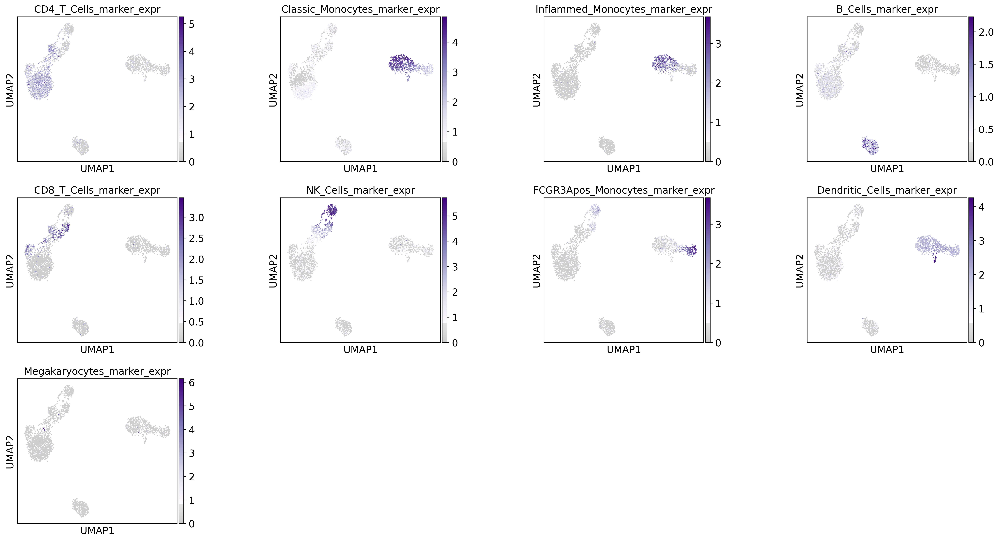

In [15]:
sc.pl.umap(adata, color=['CD4_T_Cells_marker_expr', 'Classic_Monocytes_marker_expr', 'Inflammed_Monocytes_marker_expr',
                         'B_Cells_marker_expr', 'CD8_T_Cells_marker_expr', 'NK_Cells_marker_expr', 'FCGR3Apos_Monocytes_marker_expr',
                         'Dendritic_Cells_marker_expr', 'Megakaryocytes_marker_expr'],
                  color_map=mymap_purple,
                  wspace=0.5,
                  size=10)

Using these marker expression profiles, we can see some trends in our data. Different types of monocytes are clustering together on the righthand side of the UMAP, while different types of T cells are clustering together on the lefthand side of the UMAP. We can also see a cluster of NK cells, B cells, and Dendritic Cells.

In addition to looking at combined marker expression profiles, we can also look at the expression of individual genes of interest to help us annotate our clusters.

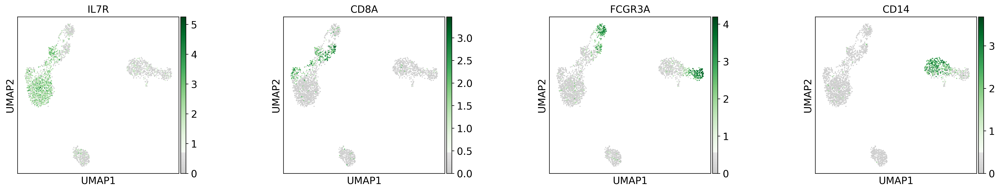

In [16]:
sc.pl.umap(adata, color=['IL7R', 'CD8A', 'FCGR3A', 'CD14'],
                  color_map=mymap_green,
                  wspace=0.5,
                  size=10)

Looking at these individual markers confirms some of the observations that we noted above with our expression marker profiles, where suspected T cells are clustering on the lefthand side of the UMAP and suspected monocytes are clustering on the righthand side of the UMAP.

## Annotation

Taken together, we can use our data-deriven marker genes, known marker genes, marker gene expression profiles, and expression of individual genes to annotate our clusters. This process can take some time depending on your dataset and prior knowledge of what cell types you expect to be present. This is how cell cluster annotation is usually done, though if you feel it is too subjective or relies too much on personal judgement there are several more objective and unbiased ways to do automated or semi-automated annotation. Check out this paper [here](https://doi.org/10.1016/j.csbj.2021.01.015) to get an idea of what tools are out there, and what general methods they use to annotate clusters. Check out [this](https://docs.scvi-tools.org/en/stable/user_guide/notebooks/cellassign_tutorial.html) tutorial to see how to use scvi-tools CellAssign, which integrates nicely with the scanpy ecosystem.

In [17]:
# Let's look at our categories to rename (i.e., the cluster labels)
adata.obs['leiden_r0.8'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7'], dtype='object')

In [18]:
# And now let's rename them!
adata.obs['leiden_r0.8'] = adata.obs['leiden_r0.8'].cat.rename_categories(['CD4+ T Cells', 
                                                                           'CD14+ Monocytes',
                                                                           'T/NK Cells', 
                                                                           'B Cells', 
                                                                           'NK Cells',
                                                                           'FCGR3A+ Monocytes', 
                                                                           'CD8+ T Cells',
                                                                           'Dendritic Cells'])

In [19]:
# Quick check to see how many cells of each type we have
adata.obs['leiden_r0.8'].value_counts()

CD4+ T Cells         931
CD14+ Monocytes      461
T/NK Cells           367
B Cells              322
NK Cells             158
FCGR3A+ Monocytes    139
CD8+ T Cells         123
Dendritic Cells       20
Name: leiden_r0.8, dtype: int64

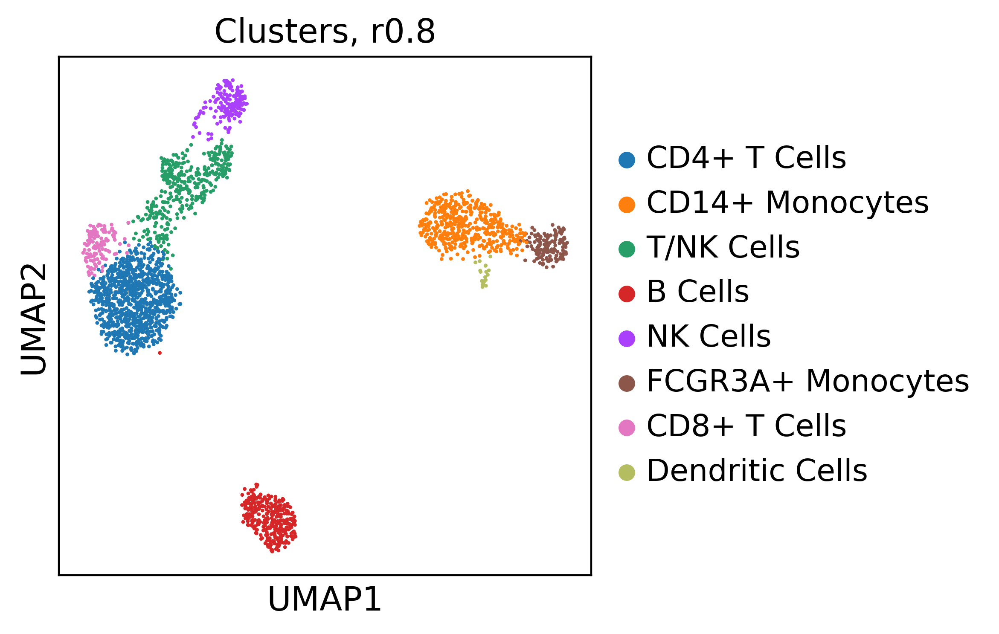

In [20]:
# Plot our UMAP with the new cluster labels
sc.pl.umap(adata, color=['leiden_r0.8'],
                  title=['Clusters, r0.8'],
                  wspace = 0.5, 
                  size = 10)

# 5 Cluster Manipulation

Sometimes it might be justified to manipulate your clusters. This could entail removing clusters from your dataset (they look stressed/dying, they are small and confounding, they are not important for your individual analysis, etc.), merging similar clusters, and splitting individual clusters to tease apart cell subtypes that might have initially been clustered together. Let's go through some examples with our dataset.

## Removing Clusters

For the sake of practice, let's filter out the Dendritic Cells cluster.

In [21]:
# The ~ in the command below inverts the boolean mask, so you can get all cells that aren't in our unwanted cluster.
adata = adata[~adata.obs['leiden_r0.8'].isin(['Dendritic Cells']),:].copy()

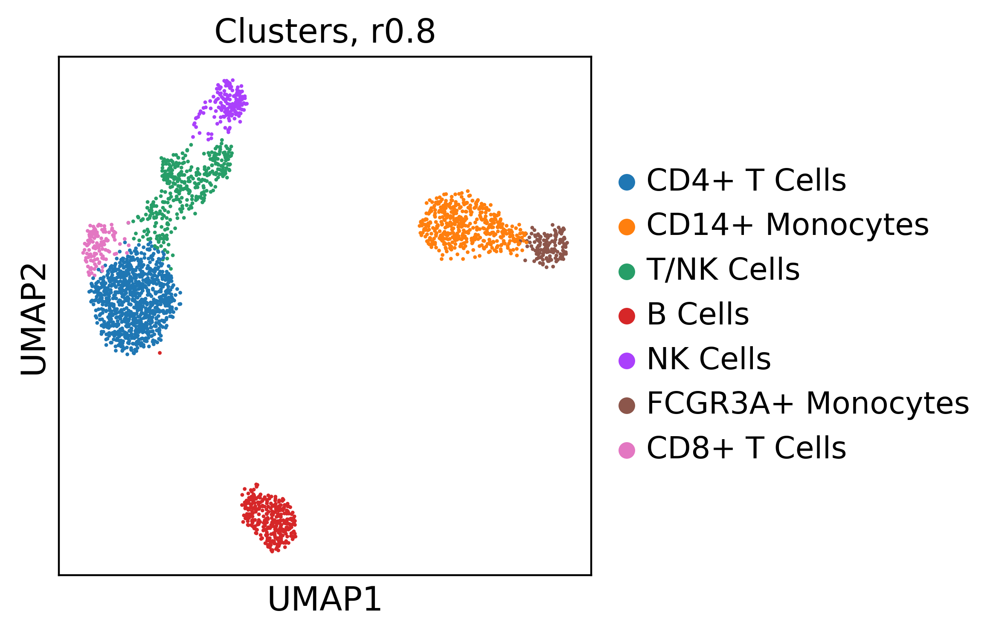

In [22]:
# Plot our UMAP, now without B Cells
sc.pl.umap(adata, color=['leiden_r0.8'],
                  title=['Clusters, r0.8'],
                  wspace = 0.5, 
                  size = 10)

## Merging Clusters

For the sake of practice, let's merge clusters CD14+ Monocytes and FCGR3A+ Monocytes.

In [23]:
# To merge clusters, we just name them the same thing
adata.obs['leiden_r0.8'] = (adata.obs["leiden_r0.8"]
                            .map(lambda x: {"CD14+ Monocytes": 
                                            "Monocytes",
                                            "FCGR3A+ Monocytes":
                                            "Monocytes"}.get(x, x))
                            .astype("category"))

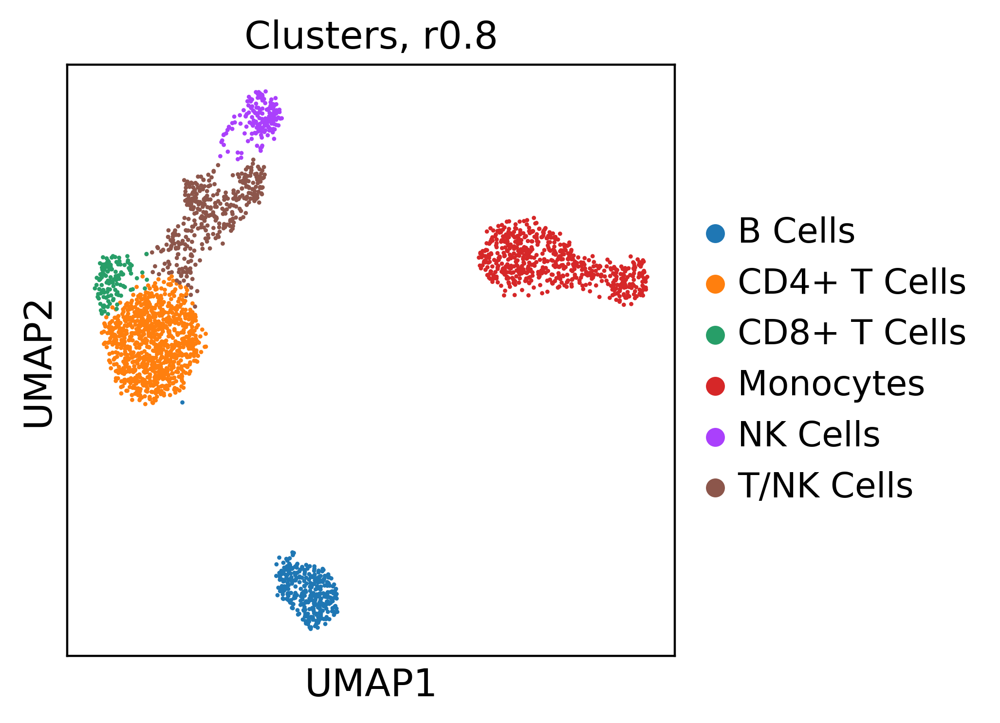

In [24]:
# Plot our UMAP
sc.pl.umap(adata, color=['leiden_r0.8'],
                  title=['Clusters, r0.8'],
                  wspace = 0.5, 
                  size = 10)

## Splitting Clusters

For the sake of practice, let's see if we can tease apart the T/NK Cell cluster and separate the T cells from the NK cells. This is a little more complicated, and involves re-clustering just the cluster of interest, getting new marker genes, and annotating the new subclusters.

In [25]:
sc.tl.leiden(adata, restrict_to=('leiden_r0.8', ['T/NK Cells']), resolution=0.3, key_added='leiden_r0.8_TNKsplit')

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_r0.8_TNKsplit', the cluster labels (adata.obs, categorical) (0:00:00)


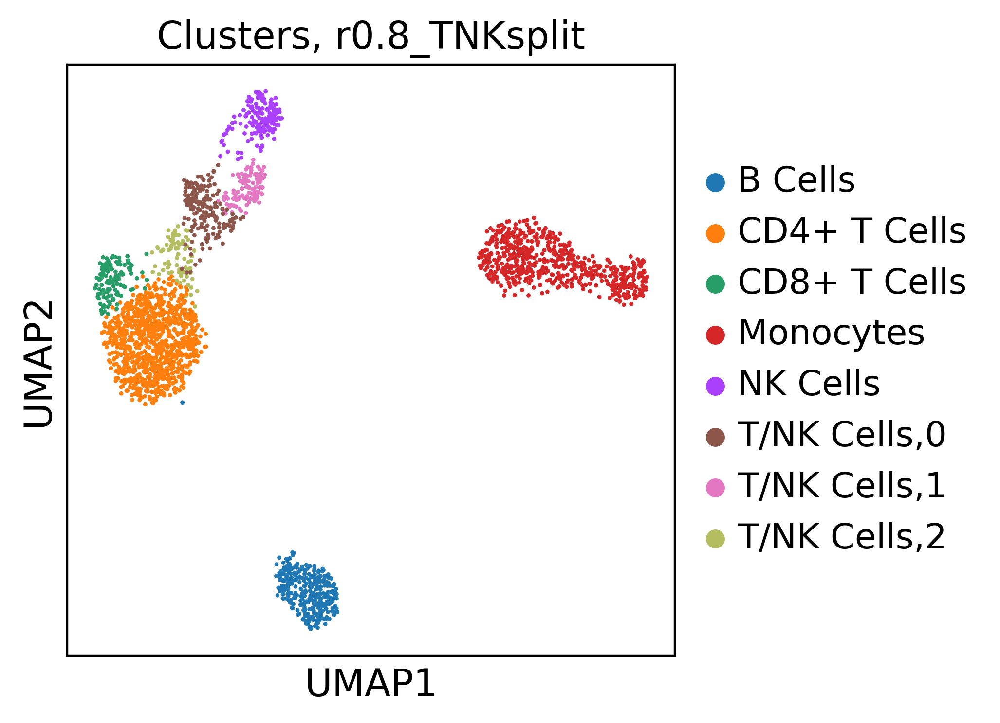

In [26]:
# Plot the new clustering
sc.pl.umap(adata, color=['leiden_r0.8_TNKsplit'],
                  title=['Clusters, r0.8_TNKsplit'],
                  wspace = 0.5, 
                  size = 10)

In [27]:
# Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.8_TNKsplit', key_added='rank_genes_TNKsplit', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_TNKsplit']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


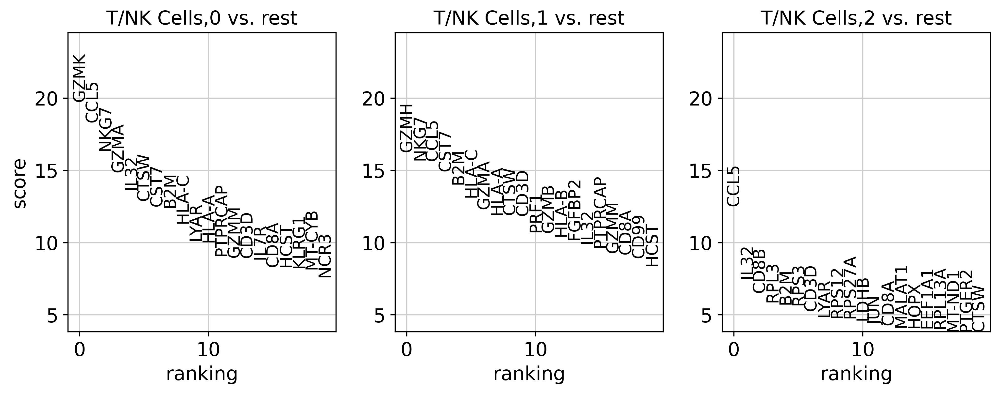

In [28]:
# Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_TNKsplit', 
                               groups=['T/NK Cells,0','T/NK Cells,1', 'T/NK Cells,2'], 
                               fontsize=12)

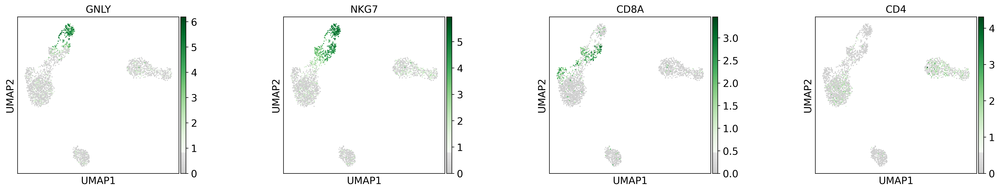

In [29]:
sc.pl.umap(adata, color=['GNLY', 'NKG7', 'CD8A', 'CD4'],
                  color_map=mymap_green,
                  wspace=0.5,
                  size=10)

It looks like our new subclusters still contain a mix of NK and T cells. For a real analysis, we might consider regressing out the effects of total counts per cell and the percentage of mitochondrial genes expressed, and re-doing the dimensional reduction and clustering of our dataset to see if that might provide cleaner distinction between cells. Typically you should hold off on regressing out anything from your dataset unless you have a good reason to. For instance, regressing out cell cycle phase is important for trajectory analysis as cell cycle is a biological signal that can mask other signals you might be looking for. Too much regression might artificially skew your dataset though, and you might end up inadvertently missing some important and interesting "true" biology. The best way to see if regressing stuff out of your dataset is helpful is to try and compare the regressed clustering results to the non-regressed results.

Here, for simplicity's sake, we will just say that our *T/NK Cells,0* cluster is T/NK Cells, *T/NK Cells,1* cluster is NK cells, and *T/NK Cells,2* is CD8+ T Cells. So let's rename and combine clusters one more time:

In [30]:
# Now we'll rename our pRGC subclusters
adata.obs['leiden_r0.8_TNKsplit'] = (adata.obs["leiden_r0.8_TNKsplit"]
                                  .map(lambda x: {"T/NK Cells,0": 
                                                  "T/NK Cells",
                                                  "T/NK Cells,1":
                                                  "NK Cells",
                                                  "T/NK Cells,2":
                                                  "CD8+ T Cells"}.get(x, x))
                                  .astype("category"))

In [31]:
# And let's make a new adata obs saving this final clustering as 'clusters'
adata.obs['clusters'] = adata.obs['leiden_r0.8_TNKsplit']

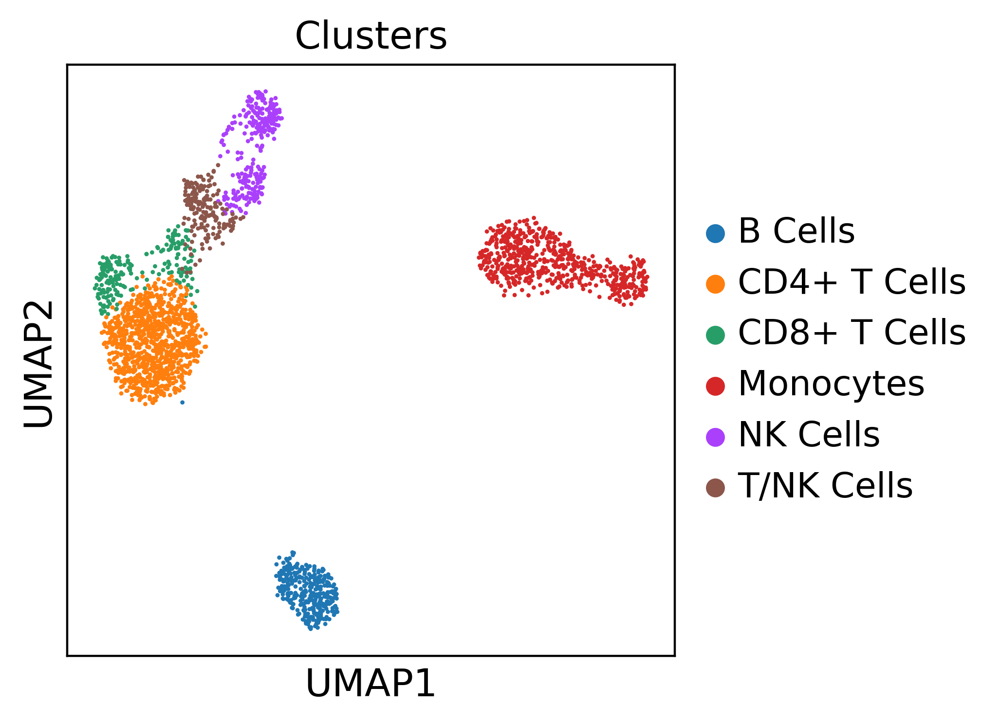

In [32]:
# Plot our final clustering
sc.pl.umap(adata, color=['clusters'],
                  title=['Clusters'],
                  wspace = 0.5, 
                  size = 10)

In [33]:
# Finally, let's save our adata object. It took a lot of work to annotate the clusters!
adata.write(results)

# 6 Summary

Congrats! Another tutorial down! You're well on your way to being a bioinformatics pro! In summary, this tutorial introduced you to all things clusters - how to generate clusters, how to annotate clusters based on data-deriven and known marker genes, and how to manipulate your clusters based on your experiment and specific questions (don't abuse that power! The more hands-off you can be with a dataset and the more unbiased it is the better!). Check out the Appendix for a few more things you can do with your clusters. And as always, (sorry this has been repeated so many times but...) there is no "one size fits all" approach to scRNA-seq analysis. You need to do what's best for your specific dataset and for your specific biological questions.

Next up, pseudotime analysis (our last tutorial for this workshop)!

# Appendix

## Subsetting Data

If we are only interested in a subset of our data, we can easily subset our adata object to just those clusters of interest. For example, let's subset just the T Cell clusters in our sample data.

In [34]:
clusters_to_include = [g for g in adata.obs['clusters'].cat.categories if (g.startswith('CD'))]

adata_tcells = adata[np.isin(adata.obs['clusters'], clusters_to_include),:].copy()

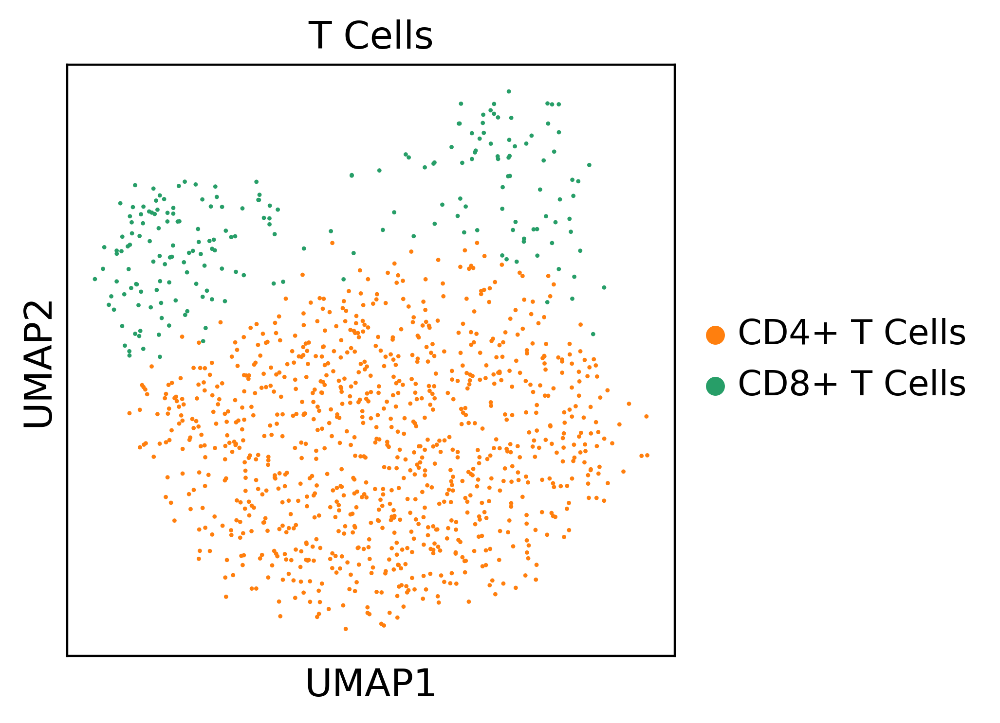

In [35]:
sc.pl.umap(adata_tcells, color=['clusters'],
                         title=['T Cells'],
                         wspace = 0.5, 
                         size = 10)

We can also take our subsetted data and re-cluster it into its own UMAP space, which might provide some additional insight into cell subtypes. To do this, we would find the highly variable genes for our subsetted data and compute new PCA, neighbors, and UMAP coordinates, and do a new cluster analysis.

filtered out 2033 genes that are detected in less than 1 cells
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_r0.5_tcells', the cluster labels (adata.obs, categorical) (0:00:00)


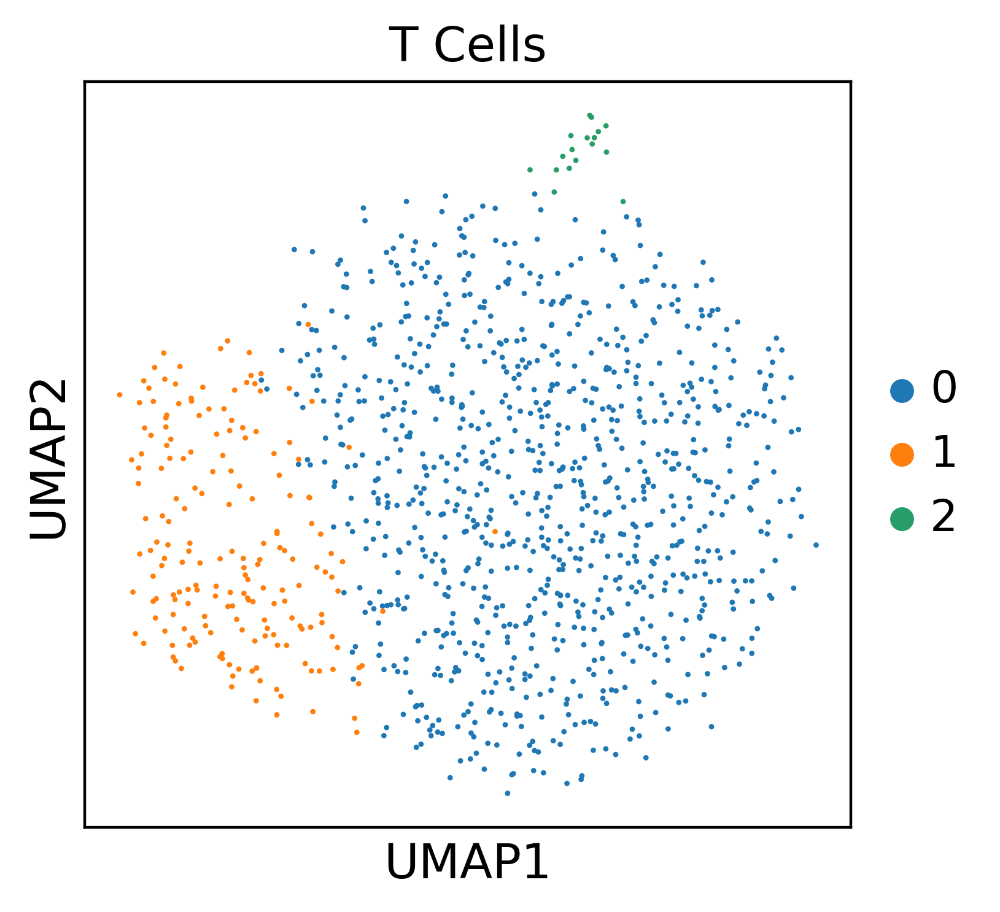

In [36]:
sc.pp.filter_genes(adata_tcells, min_cells = 1)
sc.pp.highly_variable_genes(adata_tcells, flavor='cell_ranger', n_top_genes=2000)
sc.pp.pca(adata_tcells)
sc.pp.neighbors(adata_tcells)
sc.tl.umap(adata_tcells)
sc.tl.leiden(adata_tcells, resolution=0.5, key_added='leiden_r0.5_tcells')

sc.pl.umap(adata_tcells, color=['leiden_r0.5_tcells'],
                         title=['T Cells'],
                         wspace = 0.5, 
                         size = 10)

## Compare Cluster Gene Expression

When we find our data-deriven marker genes, we are getting the top *n* number of differentially expressed genes per cluster as compared to all the other clusters. But what if we only want to compare one cluster to a single other cluster? Here's how!

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


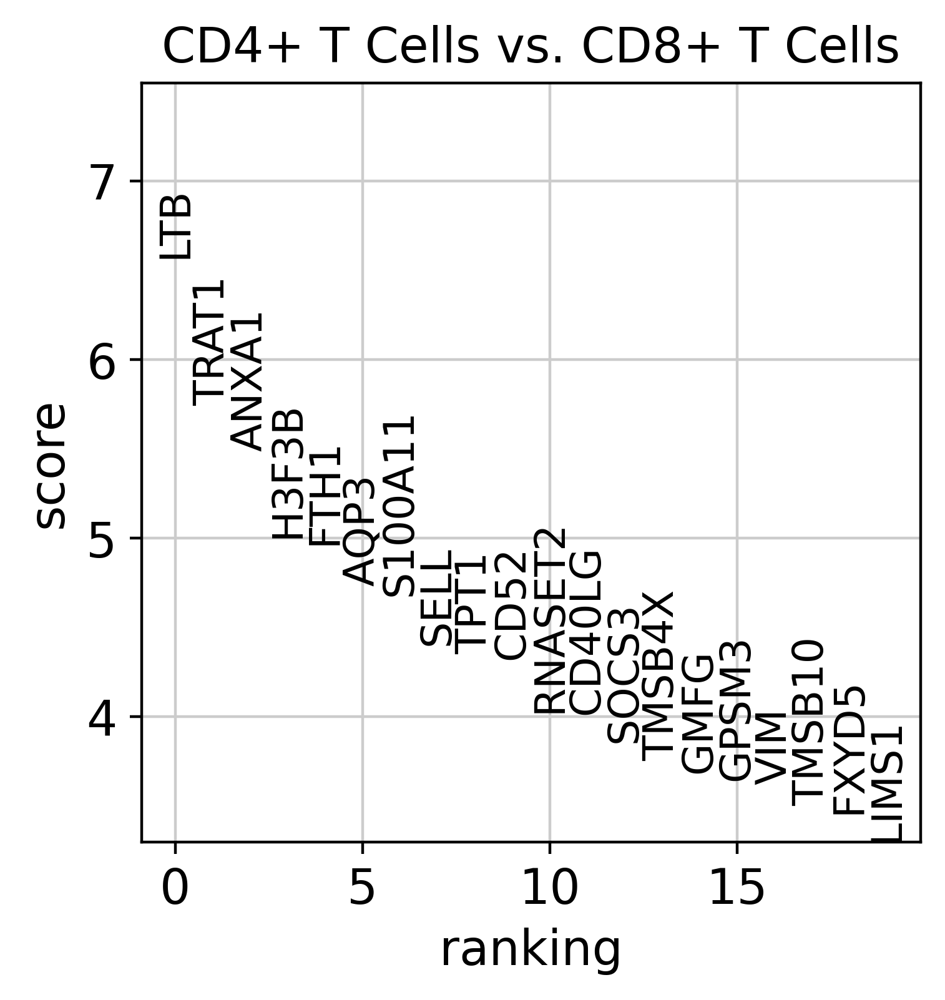

In [37]:
# Comparing CD4+ T Cells to reference cluster CD8+ T Cells
sc.tl.rank_genes_groups(adata, 'clusters', groups=['CD4+ T Cells'], reference='CD8+ T Cells', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['CD4+ T Cells'], n_genes=20, fontsize=12)

## Additional Plotting Tools

In addition to looking at the expression of various genes and marker expression profiles in UMAP space, scanpy offers many over ways to visualize data. Some plots can be more informative than others depending on your data and specific questions, and sometimes what plots you use might just come down to personal preference. Below are some examples. Play around with these different types of plots to visualize your data in different ways!

### dotplot

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: B Cells, CD4+ T Cells, CD8+ T Cells, etc.
var_group_labels: CD4_T_Cells, Classic_Monocytes, Inflammed_Monocytes, etc.


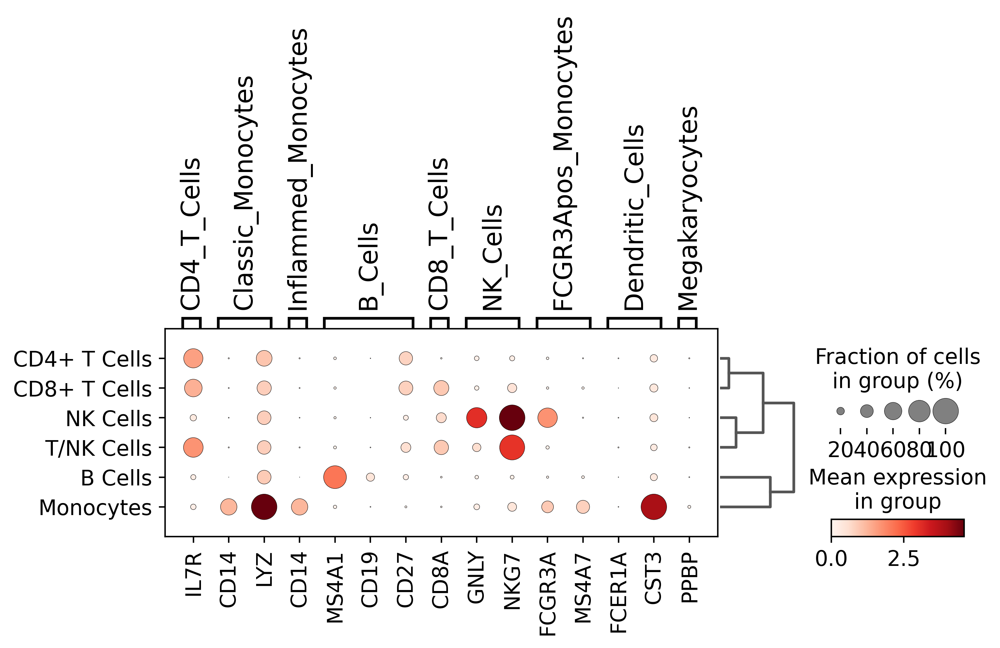

In [38]:
# dotplot example
# It can be useful to add a dendrogram to bring together similar clusters.
# The dendrogram is computed using the correlation of PCA components between clusters.
sc.pl.dotplot(adata, marker_genes, 'clusters', dendrogram=True)

### Violin plot

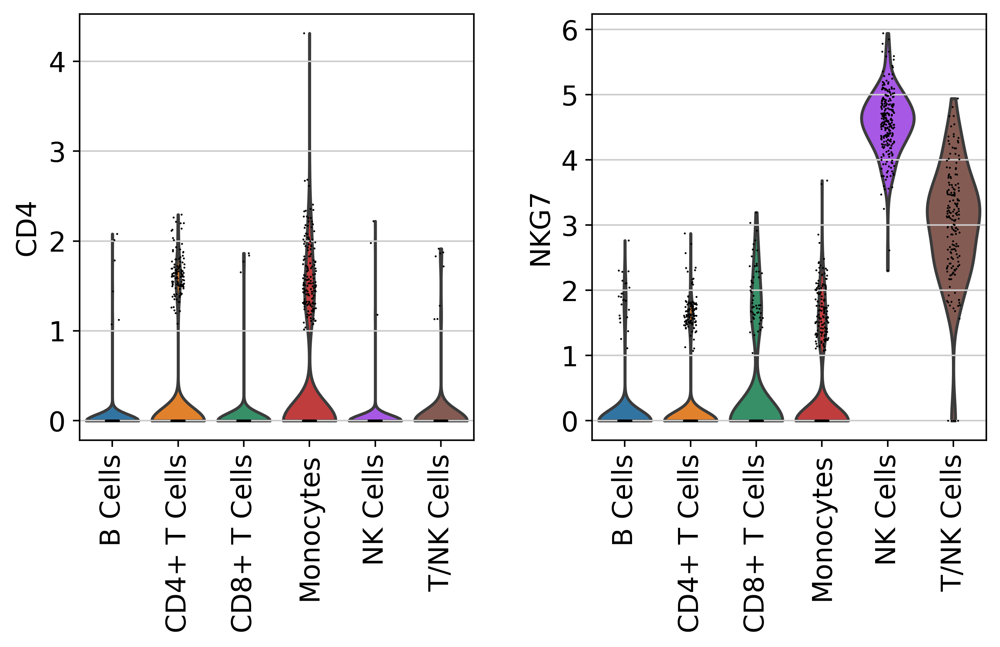

In [39]:
# violin plot example
# Violin plots can give us an idea of the distribution of gene expression values across cells.
sc.pl.violin(adata, ['CD4', 'NKG7'], groupby='clusters', rotation=90 )

### Stacked violin plot

categories: B Cells, CD4+ T Cells, CD8+ T Cells, etc.
var_group_labels: CD4_T_Cells, Classic_Monocytes, Inflammed_Monocytes, etc.


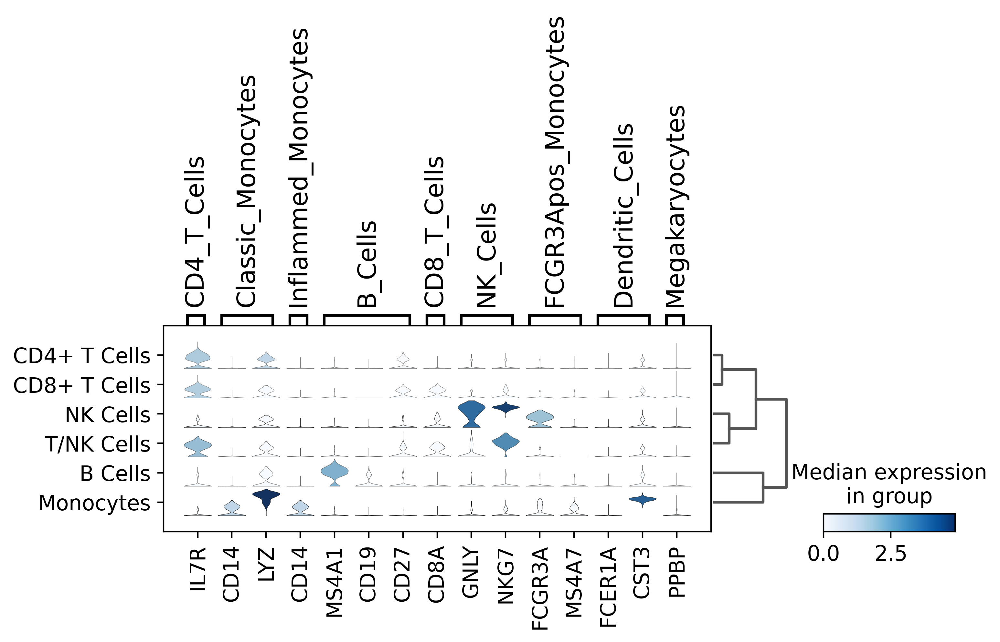

In [40]:
# stacked violin plot example
# great to look at the violin plots for all marker genes simultaneously
sc.pl.stacked_violin(adata, marker_genes, groupby='clusters', swap_axes=False, dendrogram=True)

### Matrix plot

categories: B Cells, CD4+ T Cells, CD8+ T Cells, etc.
var_group_labels: CD4_T_Cells, Classic_Monocytes, Inflammed_Monocytes, etc.


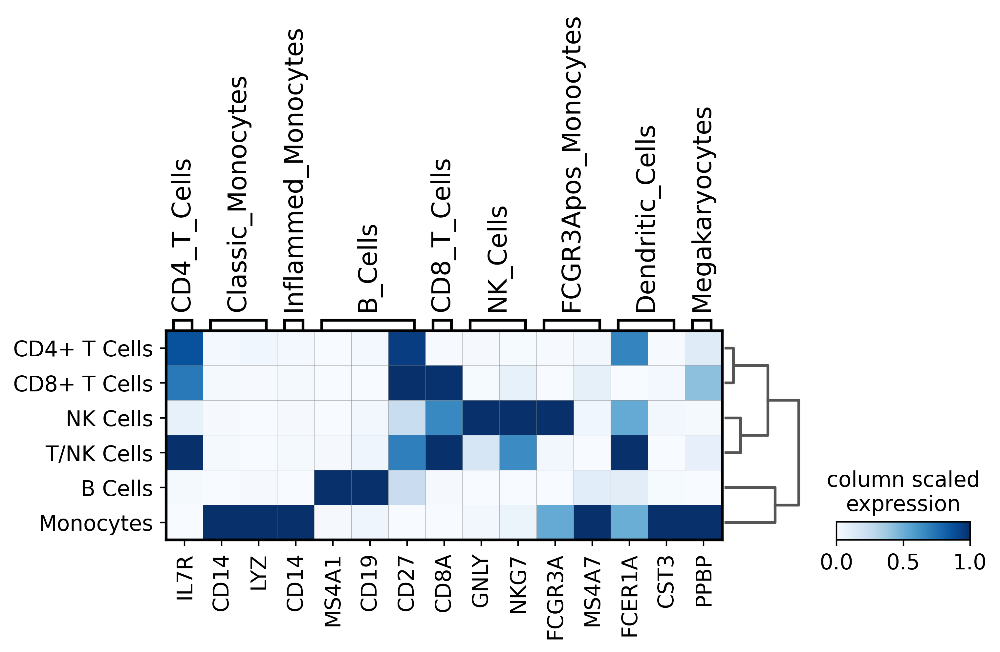

In [41]:
# matrix plot example
# simple way to visualize gene expression; heatmap of mean expression values per gene grouped by categories
# Here the expression of genes is scaled from 0 (minimum expression) to 1 (maximum mean expression)
sc.pl.matrixplot(adata, marker_genes, 'clusters', dendrogram=True, cmap='Blues', 
                 standard_scale='var', colorbar_title='column scaled\nexpression')

### Heatmap

categories: B Cells, CD4+ T Cells, CD8+ T Cells, etc.
var_group_labels: CD4_T_Cells, Classic_Monocytes, Inflammed_Monocytes, etc.


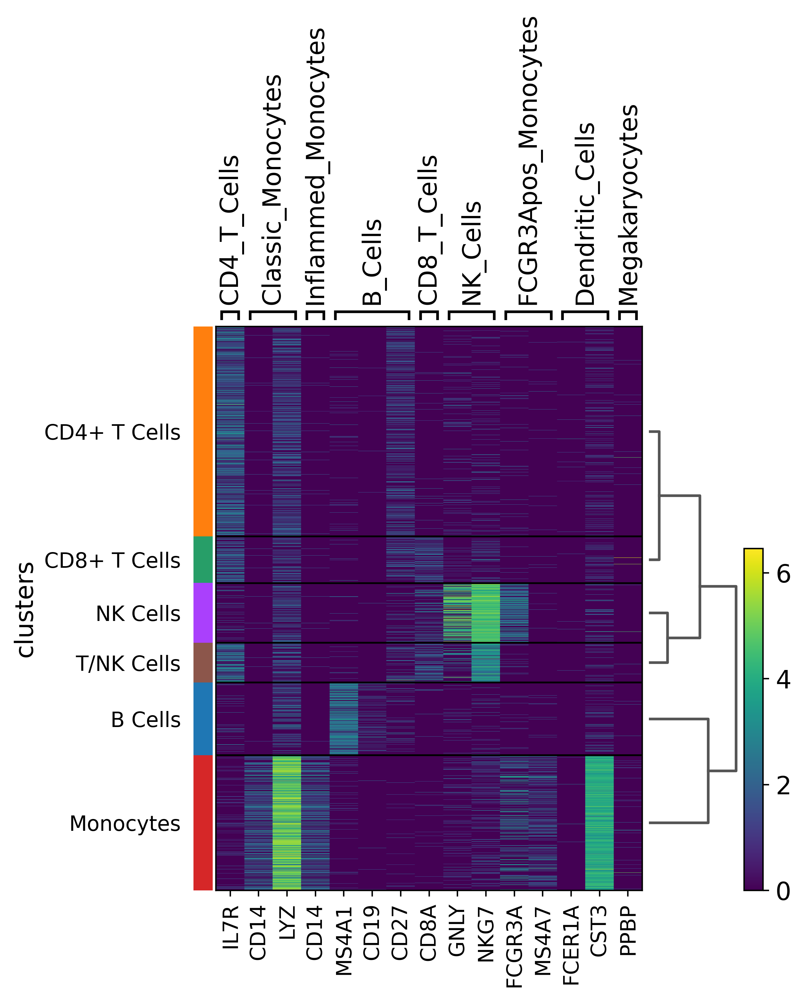

In [42]:
# Heatmap example
# Heatmaps do not collapse cells as the previous plot examples do. Instead, each cell is shown as a row.
sc.pl.heatmap(adata, marker_genes, groupby='clusters', cmap='viridis', dendrogram=True)

### Tracksplot

categories: B Cells, CD4+ T Cells, CD8+ T Cells, etc.
var_group_labels: CD4_T_Cells, Classic_Monocytes, Inflammed_Monocytes, etc.


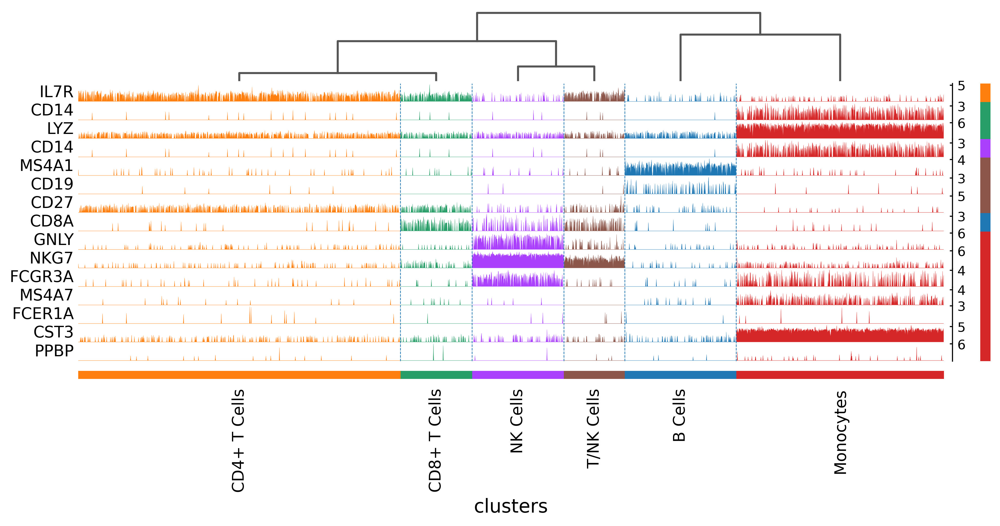

In [43]:
# tracksplot example
# This plot shows the same info as the heatmpa, but instead of a color scale, gene expression is represented by height.
sc.pl.tracksplot(adata, marker_genes, groupby='clusters', dendrogram=True)